<a href="https://colab.research.google.com/github/drSever/drSever_data_science/blob/main/Learning_projects_dl/project_6/EDA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Задача

# Sartorius - Сегментация экземпляров клеток

[Источник на Kaggle](https://www.kaggle.com/competitions/sartorius-cell-instance-segmentation/overview)

<image src="https://storage.googleapis.com/kaggle-media/competitions/Sartorius/Sartorius_Competition%20Description%20Image%20350x379.png" alt="Типы данных">

Неврологические расстройства, включая нейродегенеративные заболевания, такие как болезнь Альцгеймера, и опухоли мозга, являются основной причиной смерти и инвалидности во всем мире. Однако количественно оценить, насколько хорошо эти смертельно опасные заболевания реагируют на лечение, довольно сложно. Одним из общепринятых методов является осмотр клеток нейронов с помощью световой микроскопии, которая является доступной и неинвазивной. К сожалению, сегментация отдельных нейронных клеток на микроскопических изображениях может быть сложной и трудоемкой задачей. Точная сегментация этих клеток с помощью компьютерного зрения может привести к открытию новых эффективных лекарств для лечения миллионов людей, страдающих этими заболеваниями.


Существующие решения имеют ограниченную точность, в частности, для клеток нейронов. В ходе внутренних исследований, направленных на разработку моделей сегментации экземпляров клеток, клеточная линия нейробластомы SH-SY5Y постоянно демонстрирует самые низкие показатели точности среди восьми различных типов раковых клеток. Это может быть связано с тем, что клетки нейронов имеют очень уникальную, особенную морфологию, что делает их сложными для сегментации с помощью обычно используемых масок.

Sartorius - партнер в области медико-биологических исследований и биофармацевтической промышленности. Они помогают ученым и инженерам упростить и ускорить прогресс в области медико-биологических наук и биопроцессинга, позволяя разрабатывать новые и более эффективные методы лечения и более доступные лекарства. Они являются магнитом и динамичной платформой для первопроходцев и ведущих экспертов в этой области. Они объединяют творческие умы для достижения общей цели: технологических прорывов, которые приводят к улучшению здоровья большего числа людей.

В этом конкурсе вам предстоит обнаружить и выделить отдельные объекты интереса на биологических изображениях, изображающих типы клеток нейронов, которые обычно используются при изучении неврологических расстройств. Более конкретно, вы будете использовать изображения фазово-контрастной микроскопии для обучения и тестирования вашей модели сегментации нейронных клеток. Успешные модели будут делать это с высокой степенью точности.

В случае успеха вы поможете дальнейшим исследованиям в области нейробиологии благодаря сбору надежных количественных данных. Ученые смогут использовать их для более точного определения влияния заболеваний и условий лечения на клетки нейронов. В результате могут быть открыты новые лекарства для лечения миллионов людей, страдающих от этих основных причин смерти и инвалидности.

# Описание датасета

В этом соревновании мы сегментируем клетки нейронов на изображениях. Обучающие аннотации предоставляются в виде масок, закодированных по длине пробега, а изображения - в формате PNG. Количество изображений невелико, но число аннотированных объектов довольно велико. Скрытый тестовый набор составляет примерно 240 изображений.

**Примечание:** хотя предсказания не должны перекрываться, обучающие метки предоставляются в полном объеме (с учетом перекрывающихся частей). Это необходимо для того, чтобы обеспечить модели полными данными по каждому объекту. Устранение перекрытия в прогнозах - задача для конкурсанта.

***train.csv*** - идентификаторы и маски для всех объектов обучения. Для тестового набора такие метаданные не предоставляются.

---

***id*** - уникальный идентификатор объекта

***annotation*** - пиксели, закодированные в длине пробега для идентифицированной нейронной клетки

***width*** - ширина исходного изображения

***height*** - высота исходного изображения

***cell_type*** - клеточная линия

***plate_time*** - время создания пластины

***sample_date*** - дата создания образца

***sample_id*** - идентификатор образца

***elapsed_timedelta*** - время с момента получения первого изображения образца

---

***sample_submission.csv*** - файл отправки образцов в правильном формате

***train*** - тренировочные изображения в формате PNG

***test*** - тестовые изображения в формате PNG. Только несколько изображений тестового набора доступны для загрузки; остальные могут быть доступны только в ваших блокнотах при подаче заявки.

***train_semi_supervised*** - немаркированные изображения, предлагаемые на случай, если вы хотите использовать дополнительные данные для полунаблюдательного подхода.

***LIVECell_dataset_2021*** - зеркало данных из набора LIVECell. LIVECell - это набор данных-предшественник данного конкурса. Вы найдете дополнительные данные для клеточной линии SH-SHY5Y, а также несколько других клеточных линий, не включенных в конкурсный набор данных, которые могут представлять интерес для трансферного обучения.

# Решение

## 1.0. Загрузим необходимые библиотеки

In [ ]:
import os
from google.colab import drive
import json
import cv2

import pandas as pd
import numpy as np

from datetime import datetime

import albumentations as A

from tqdm.auto import tqdm
import matplotlib.pyplot as plt

## 2.0. Подготовка данных

Подключим Google Drive:

In [ ]:
drive.mount('/content/gdrive')

Mounted at /content/gdrive


Распакуем данные в локальную папку `data`:

In [ ]:
!unzip -q /content/gdrive/MyDrive/Colab_Notebooks/Learning_projects/Segmentation_2_Kaggle/sartorius-cell-instance-segmentation.zip

In [ ]:
old_name = r"/content/sartorius-cell-instance-segmentation"
new_name = r"/content/data"
os.rename(old_name, new_name)

## 3.0. Работа с данными

### 3.1. Выведем примеры изображений

Пример из тренировочного датасета:

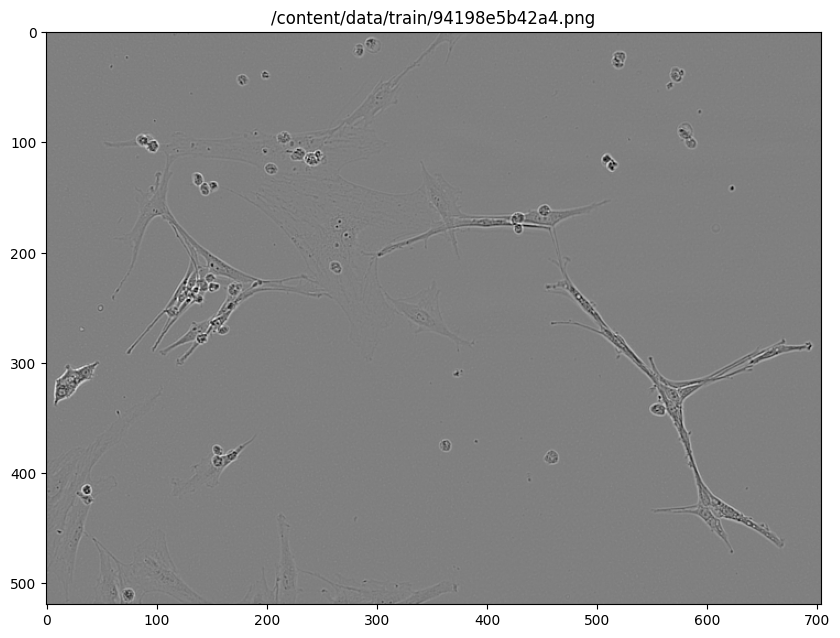

In [ ]:
# случайный файл
random_img_file = !ls /content/data/train/*png | shuf -n 1
img = cv2.imread(random_img_file[0])

# визуализруем случайный файл
plt.figure(figsize=(10, 10))
plt.title(f'{random_img_file[0]}')
plt.imshow(img)
plt.show();

Пример из датасета LIVECell:

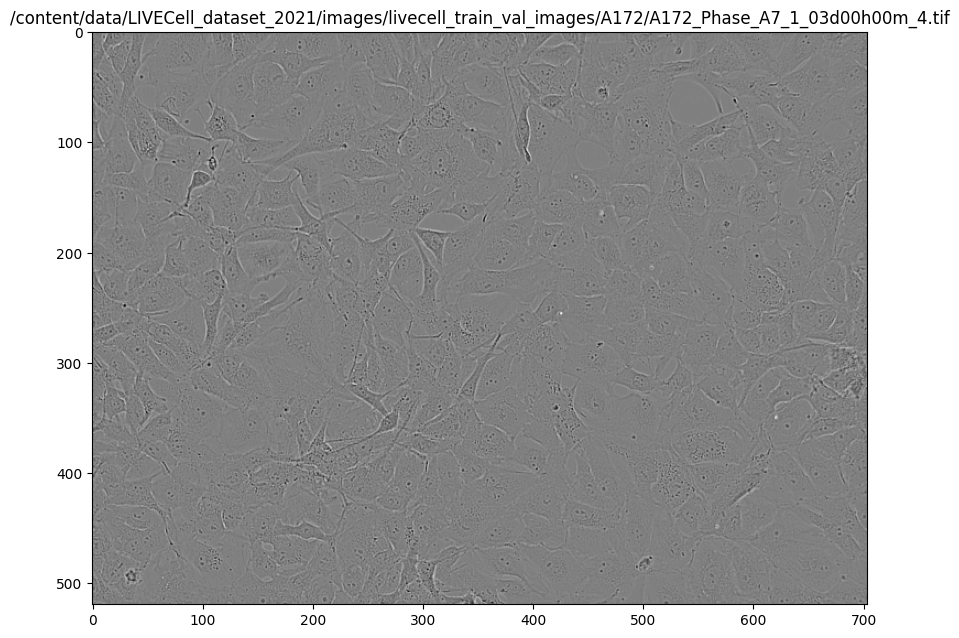

In [ ]:
# случайный файл
random_img_file = !ls /content/data/LIVECell_dataset_2021/images/livecell_train_val_images/A172/*tif | shuf -n 1
img = cv2.imread(random_img_file[0])

# визуализруем случайный файл
plt.figure(figsize=(10, 10))
plt.title(f'{random_img_file[0]}')
plt.imshow(img)
plt.show();

### 3.2. Идентификаторы и маски обучающей выборки

Загрузим в датафрейм идентификаторы и маски для объектов обучения:

In [ ]:
train_df = pd.read_csv('/content/data/train.csv')

In [ ]:
train_df.head().T

,0,1,2,3,4
id,0030fd0e6378,0030fd0e6378,0030fd0e6378,0030fd0e6378,0030fd0e6378
annotation,118145 6 118849 7 119553 8 120257 8 120961 9 1...,189036 1 189739 3 190441 6 191144 7 191848 8 1...,173567 3 174270 5 174974 5 175678 6 176382 7 1...,196723 4 197427 6 198130 7 198834 8 199538 8 2...,167818 3 168522 5 169225 7 169928 8 170632 9 1...
width,704,704,704,704,704
height,520,520,520,520,520
cell_type,shsy5y,shsy5y,shsy5y,shsy5y,shsy5y
plate_time,11h30m00s,11h30m00s,11h30m00s,11h30m00s,11h30m00s
sample_date,2019-06-16,2019-06-16,2019-06-16,2019-06-16,2019-06-16
sample_id,shsy5y[diff]_E10-4_Vessel-714_Ph_3,shsy5y[diff]_E10-4_Vessel-714_Ph_3,shsy5y[diff]_E10-4_Vessel-714_Ph_3,shsy5y[diff]_E10-4_Vessel-714_Ph_3,shsy5y[diff]_E10-4_Vessel-714_Ph_3
elapsed_timedelta,0 days 11:30:00,0 days 11:30:00,0 days 11:30:00,0 days 11:30:00,0 days 11:30:00


#### 3.2.1. Признак `annotations`

Аннотации представлены в виде строк и нестандартны:

In [ ]:
train_df['annotation']

0        118145 6 118849 7 119553 8 120257 8 120961 9 1...
1        189036 1 189739 3 190441 6 191144 7 191848 8 1...
2        173567 3 174270 5 174974 5 175678 6 176382 7 1...
3        196723 4 197427 6 198130 7 198834 8 199538 8 2...
4        167818 3 168522 5 169225 7 169928 8 170632 9 1...
                               ...                        
73580    3610 3 4311 7 5014 9 5717 11 6420 13 7123 15 7...
73581    341585 2 342287 5 342988 10 343690 13 344394 1...
73582    47788 3 48490 7 49192 11 49896 13 50599 14 513...
73583    333290 1 333993 2 334696 4 335399 5 336102 6 3...
73584    249775 2 250477 6 251180 8 251882 11 252585 12...
Name: annotation, Length: 73585, dtype: object

In [ ]:
train_df['annotation'].loc[0]

'118145 6 118849 7 119553 8 120257 8 120961 9 121665 10 122369 12 123074 13 123778 14 124482 15 125186 16 125890 17 126594 18 127298 19 128002 20 128706 21 129410 22 130114 23 130818 24 131523 24 132227 25 132931 25 133635 24 134339 24 135043 23 135748 21 136452 19 137157 16 137864 11 138573 4'

#### 3.2.2. Признак `cell_type`

In [ ]:
train_df['cell_type'].value_counts()

shsy5y    52286
cort      10777
astro     10522
Name: cell_type, dtype: int64

Есть только 3 клеточных типа (линии):
-  `shsy5y` - это клетки нейробластомы (злокачественной опухоли головного мозга, [здесь](https://en.wikipedia.org/wiki/SH-SY5Y) более подробно, кому интересно). Правда, на картинке выше (в начале ноутбука) они обозначены, как клетки нейроглиобластомы, но не суть.
- `astro`, то тут не совсем понятно, что это за клеточная линия конкретно в данном датасете. `astro` - возможно, сокращение от `Astrocyte` ([разновидность клеток головного мозга](https://en.wikipedia.org/wiki/Astrocyte)). Об этом нам говорит опять таки картинка в начале ноутбука.
- `cort` - скорее всего линия нормальных нейронов.

Попробуем визуализировать эти клеточные линии:

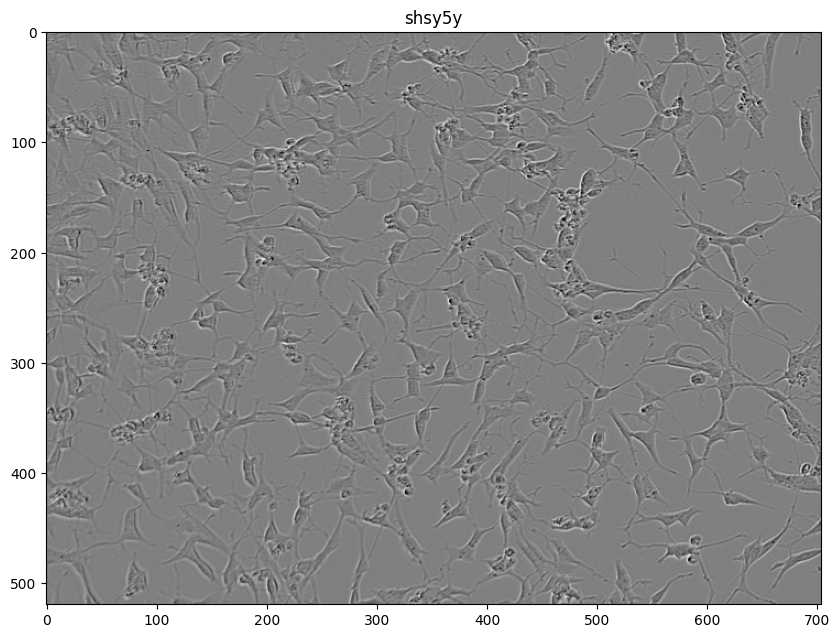

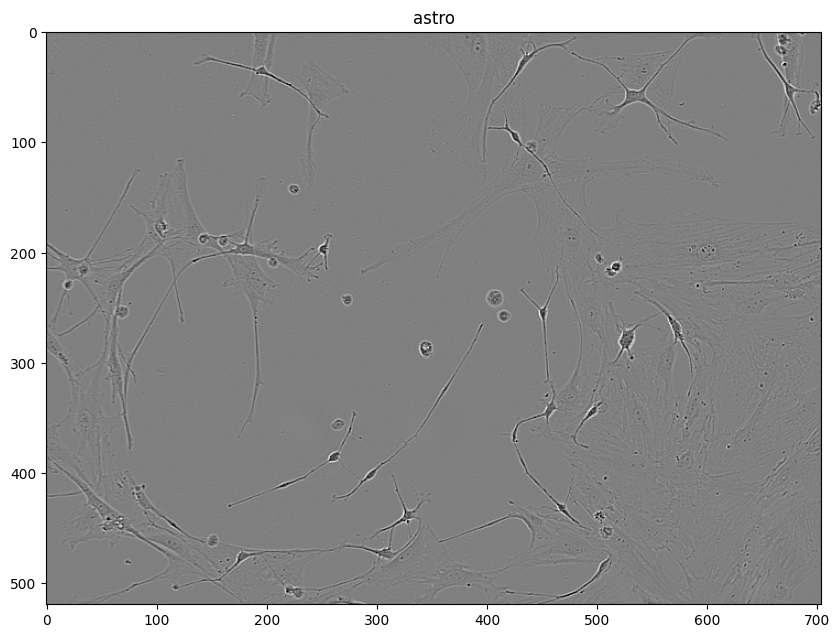

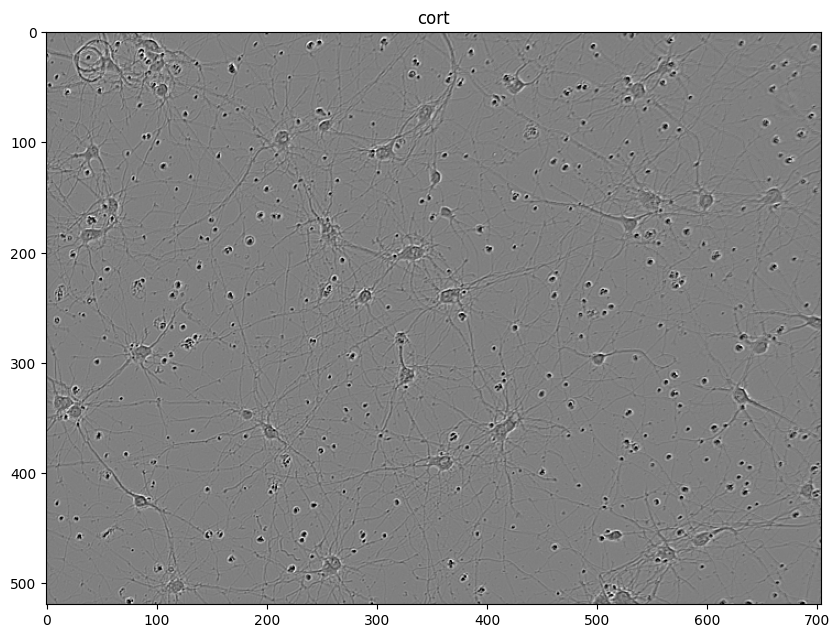

In [ ]:
for cell_type in train_df['cell_type'].unique():
    values = train_df[train_df['cell_type'] == cell_type].sample(1).iloc[0]
    img_id = values['id']
    cell_type = values['cell_type']
    img = cv2.imread(f'data/train/{img_id}.png')
    plt.figure(figsize=(10, 10))
    plt.title(f'{cell_type}')
    plt.imshow(img)
    plt.show()

In [ ]:
grouped = train_df.groupby(['cell_type', 'sample_id']).agg({'sample_id':'count'})
grouped

sample_id
cell_type sample_id                                   
astro     astro[hippo]_D1-1_Vessel-361_Ph_3         68
          astro[hippo]_D1-2_Vessel-361_Ph_4        103
          astro[hippo]_D1-4_Vessel-361_Ph_1         34
          astro[hippo]_D1-4_Vessel-361_Ph_3         87
          astro[hippo]_D1-4_Vessel-361_Ph_4         57
...                                                ...
shsy5y    shsy5y[diff]_E8-3_Vessel-714_Ph_2        279
          shsy5y[diff]_E8-3_Vessel-714_Ph_4        235
          shsy5y[diff]_E8-4_Vessel-714_Ph_1        247
          shsy5y[diff]_E8-4_Vessel-714_Ph_2        721
          shsy5y[diff]_E8-4_Vessel-714_Ph_3        664

[403 rows x 1 columns]

В каждой клеточной линии множество семплов (суммарно 403).

#### 3.2.3. Признак `plate_time`

Время создания пластины (образца). Вероятно, имеется в виду время приготовления микропрепарата для исследования под микроскопом (если коротко и грубо, кусочек ткани нарезается на тонкие слои и фиксируется на стекле).

In [ ]:
train_df['plate_time']

0        11h30m00s
1        11h30m00s
2        11h30m00s
3        11h30m00s
4        11h30m00s
           ...    
73580    11h59m00s
73581    11h59m00s
73582    11h59m00s
73583    11h59m00s
73584    11h59m00s
Name: plate_time, Length: 73585, dtype: object

Приводим к `datetime`:

In [ ]:
train_df['plate_time'] = train_df['plate_time'].apply(lambda x: datetime.strptime(x, '%Hh%Mm%Ss'))

In [ ]:
train_df['plate_time'].value_counts()

1900-01-01 11:30:00    52286
1900-01-01 09:00:00     6462
1900-01-01 13:30:00     5704
1900-01-01 13:00:00     4060
1900-01-01 19:30:00     2130
1900-01-01 11:59:00     1292
1900-01-01 07:30:00      923
1900-01-01 01:30:00      728
Name: plate_time, dtype: int64

Ничего в глаза не бросается? :)

In [ ]:
train_df[train_df['plate_time'] == '1900-01-01 11:30:00']['cell_type'].value_counts()

shsy5y    52286
Name: cell_type, dtype: int64

Получается, что время изготовления всех образцов клеточной линии `shsy5y` одинаковое и уникальное - `1900-01-01 11:30:00`

In [ ]:
train_df[train_df['cell_type'] == 'astro']['plate_time'].value_counts()

1900-01-01 09:00:00    6462
1900-01-01 13:00:00    4060
Name: plate_time, dtype: int64

In [ ]:
train_df[train_df['cell_type'] == 'cort']['plate_time'].value_counts()

1900-01-01 13:30:00    5704
1900-01-01 19:30:00    2130
1900-01-01 11:59:00    1292
1900-01-01 07:30:00     923
1900-01-01 01:30:00     728
Name: plate_time, dtype: int64

Образцы `astro` изготавливались только в `09:00:00` и `13:00:00`, все оставшееся время соответствует образцам клеточной линии `cort`.

Попрбуем это визуализировать:

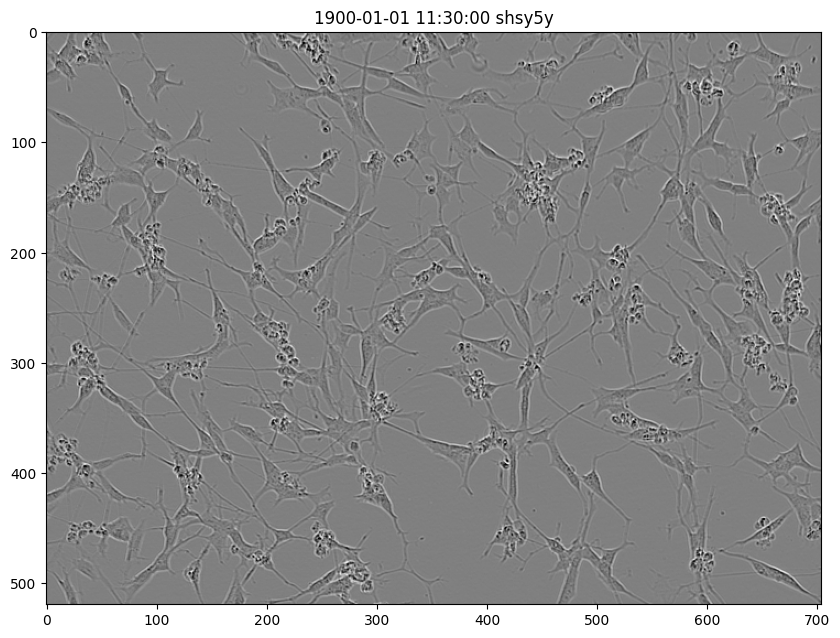

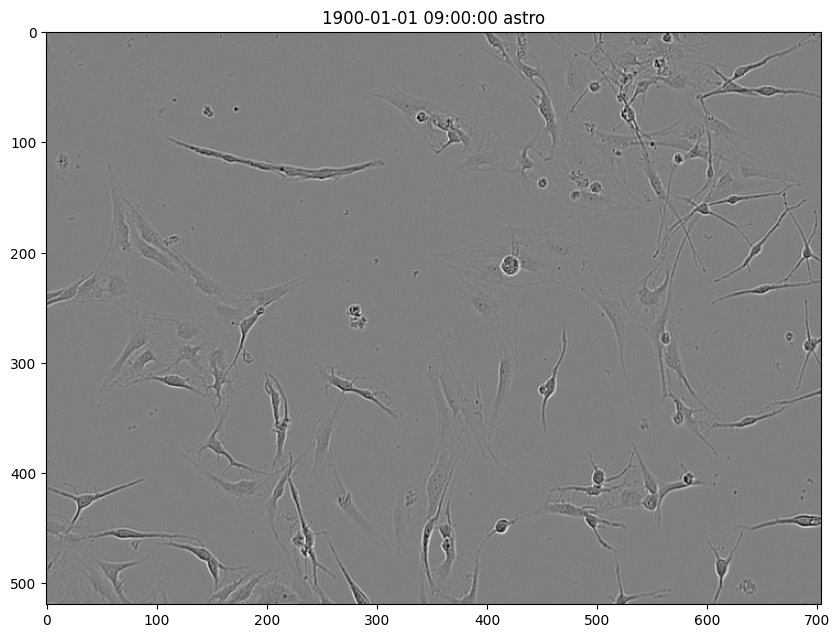

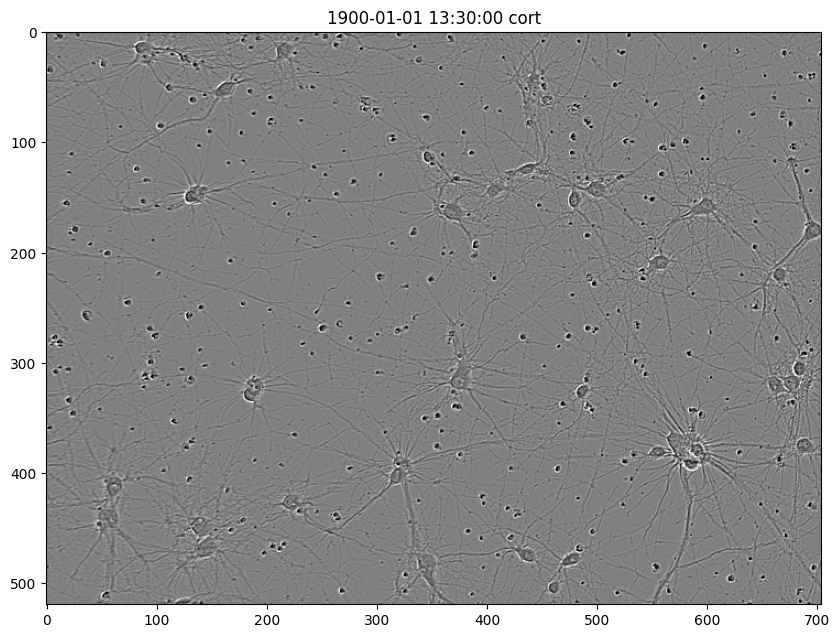

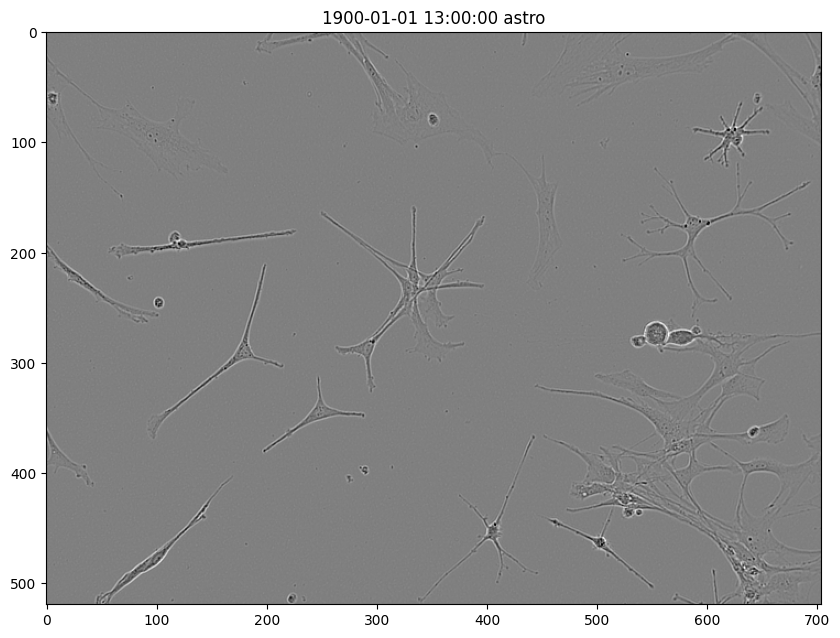

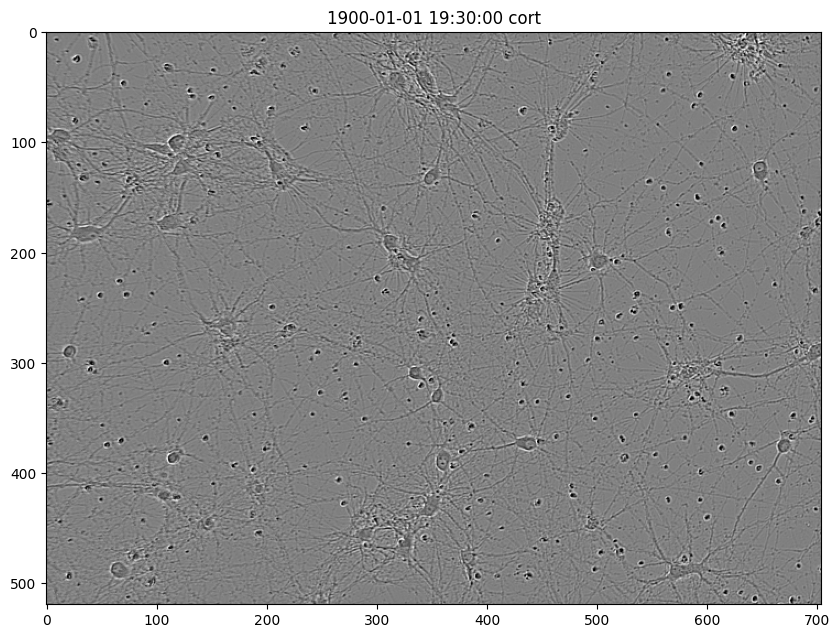

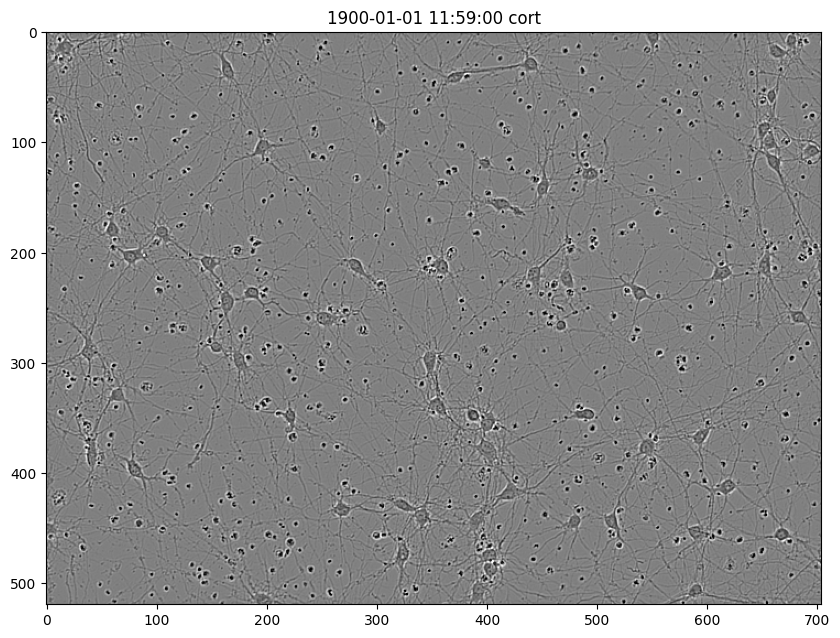

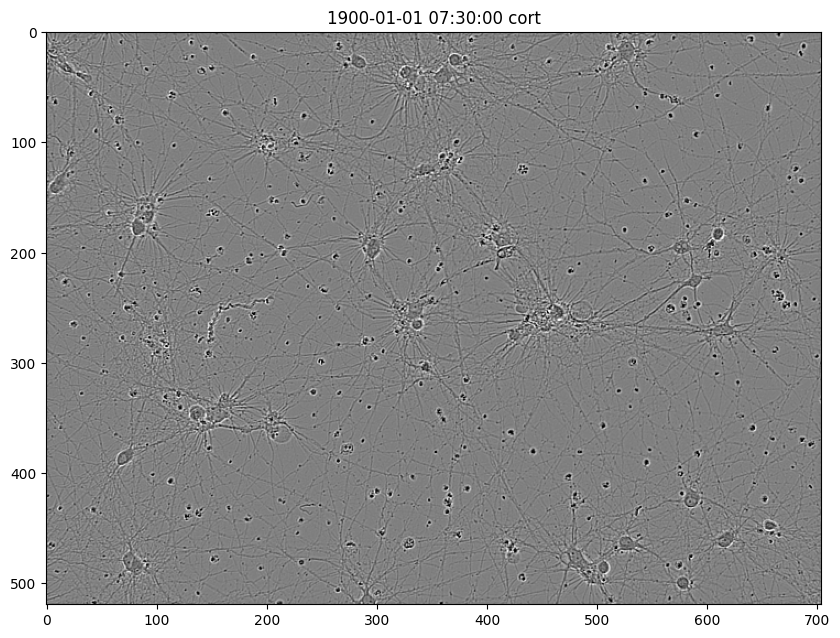

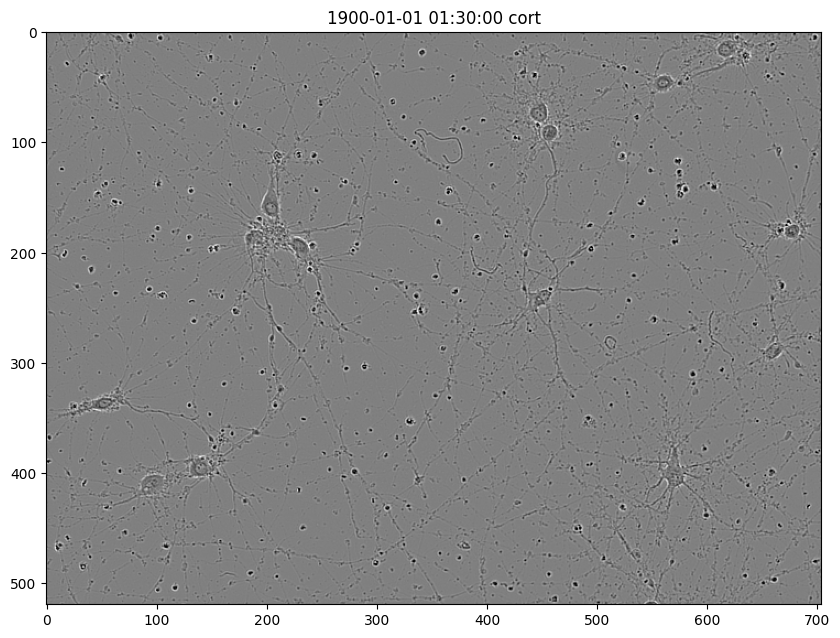

In [ ]:
for plate_time in train_df['plate_time'].value_counts().index:
    values = train_df[train_df['plate_time'] == plate_time].sample(1).iloc[0]
    img_id = values['id']
    cell_type = values['cell_type']
    img = cv2.imread(f'data/train/{img_id}.png')
    plt.figure(figsize=(10, 10))
    plt.title(f'{plate_time} {cell_type}')
    plt.imshow(img)
    plt.show()

#### 3.2.4. Признак `sample_date`

Дата создания пластины (образца)

In [ ]:
train_df['sample_date']

0        2019-06-16
1        2019-06-16
2        2019-06-16
3        2019-06-16
4        2019-06-16
            ...    
73580    2020-11-01
73581    2020-11-01
73582    2020-11-01
73583    2020-11-01
73584    2020-11-01
Name: sample_date, Length: 73585, dtype: object

Переодим в `datetime`:

In [ ]:
train_df['sample_date'] = train_df['sample_date'].apply(lambda x: datetime.strptime(x, '%Y-%m-%d'))

In [ ]:
train_df['sample_date'].value_counts()

2019-06-16    18435
2019-06-14    17026
2019-06-15    16825
2020-09-14     3406
2020-09-13     2572
2020-11-04     2213
2020-11-05     1996
2020-11-03     1976
2020-09-16     1756
2020-09-12     1429
2020-09-15     1359
2020-11-01     1222
2020-11-07      659
2020-10-26      651
2020-10-30      647
2020-10-29      592
2020-10-27      561
2020-11-06      260
Name: sample_date, dtype: int64

Мы видим даты от середины 2019 до конца 2020 года.

In [ ]:
grouped = train_df.groupby(['sample_date','cell_type']).agg({'id':'count'}).\
    reset_index().rename(columns={'id':'counts'})
grouped

,sample_date,cell_type,counts
0,2019-06-14,shsy5y,17026
1,2019-06-15,shsy5y,16825
2,2019-06-16,shsy5y,18435
3,2020-09-12,astro,1429
4,2020-09-13,astro,2572
5,2020-09-14,astro,3406
6,2020-09-15,astro,1359
7,2020-09-16,astro,1756
8,2020-10-26,cort,651
9,2020-10-27,cort,561


Сначала создавались образцы `shsy5y` в течение 3-х дней июня 2019, потом образцы `astro` в течение 5 дней в сентябре 2020, а потом до ноября 2020 включительно образцы `cort`.

#### 3.2.5. Признак `elapsed_timedelta`

Время с момента получения первого изображения образца

In [ ]:
train_df['elapsed_timedelta']

0        0 days 11:30:00
1        0 days 11:30:00
2        0 days 11:30:00
3        0 days 11:30:00
4        0 days 11:30:00
              ...       
73580    0 days 11:59:00
73581    0 days 11:59:00
73582    0 days 11:59:00
73583    0 days 11:59:00
73584    0 days 11:59:00
Name: elapsed_timedelta, Length: 73585, dtype: object

In [ ]:
train_df['elapsed_days'] = train_df['elapsed_timedelta'].apply(lambda x: x.split()[0])

In [ ]:
train_df['elapsed_days'].value_counts()

0    73585
Name: elapsed_days, dtype: int64

Во всех представленных тренировочных образцах время с момента получения первого изображения менее суток.

Хорошо, тогда посчитаем то же самое, но в часах:

In [ ]:
train_df['elapsed_hours'] = train_df['elapsed_timedelta'].apply(lambda x: datetime.strptime(x.split()[-1], '%H:%M:%S'))

In [ ]:
train_df['elapsed_hours'].value_counts()

1900-01-01 11:30:00    52286
1900-01-01 09:00:00     6462
1900-01-01 13:30:00     5704
1900-01-01 13:00:00     4060
1900-01-01 19:30:00     2130
1900-01-01 11:59:00     1292
1900-01-01 07:30:00      923
1900-01-01 01:30:00      728
Name: elapsed_hours, dtype: int64

In [ ]:
train_df['plate_time'].value_counts()

1900-01-01 11:30:00    52286
1900-01-01 09:00:00     6462
1900-01-01 13:30:00     5704
1900-01-01 13:00:00     4060
1900-01-01 19:30:00     2130
1900-01-01 11:59:00     1292
1900-01-01 07:30:00      923
1900-01-01 01:30:00      728
Name: plate_time, dtype: int64

In [ ]:
train_df[train_df['plate_time'] == datetime.strptime('01:30:00', '%H:%M:%S')]

,id,annotation,width,height,cell_type,plate_time,sample_date,sample_id,elapsed_timedelta,elapsed_days,elapsed_hours
1924,0728b8f39241,250406 7 251109 9 251811 11 252514 13 253217 1...,704,520,cort,1900-01-01 01:30:00,2020-11-05,cort[oka-high]_B6-1_Vessel-377_Ph_4,0 days 01:30:00,0,1900-01-01 01:30:00
1925,0728b8f39241,202120 3 202822 8 203523 13 204226 16 204929 1...,704,520,cort,1900-01-01 01:30:00,2020-11-05,cort[oka-high]_B6-1_Vessel-377_Ph_4,0 days 01:30:00,0,1900-01-01 01:30:00
1926,0728b8f39241,319606 11 320309 12 321011 14 321714 15 322418...,704,520,cort,1900-01-01 01:30:00,2020-11-05,cort[oka-high]_B6-1_Vessel-377_Ph_4,0 days 01:30:00,0,1900-01-01 01:30:00
1927,0728b8f39241,80209 3 80911 7 81612 12 82314 15 83016 17 837...,704,520,cort,1900-01-01 01:30:00,2020-11-05,cort[oka-high]_B6-1_Vessel-377_Ph_4,0 days 01:30:00,0,1900-01-01 01:30:00
1928,0728b8f39241,40644 8 41347 11 42049 14 42752 16 43456 16 44...,704,520,cort,1900-01-01 01:30:00,2020-11-05,cort[oka-high]_B6-1_Vessel-377_Ph_4,0 days 01:30:00,0,1900-01-01 01:30:00
...,...,...,...,...,...,...,...,...,...,...,...
72158,f6e7e998a190,58888 7 59590 10 60289 16 60993 17 61696 18 62...,704,520,cort,1900-01-01 01:30:00,2020-11-05,cort[oka-high]_B5-4_Vessel-377_Ph_1,0 days 01:30:00,0,1900-01-01 01:30:00
72159,f6e7e998a190,283099 15 283800 20 284504 20 285207 21 285911...,704,520,cort,1900-01-01 01:30:00,2020-11-05,cort[oka-high]_B5-4_Vessel-377_Ph_1,0 days 01:30:00,0,1900-01-01 01:30:00
72160,f6e7e998a190,99469 1 100172 4 100876 5 101579 7 102282 8 10...,704,520,cort,1900-01-01 01:30:00,2020-11-05,cort[oka-high]_B5-4_Vessel-377_Ph_1,0 days 01:30:00,0,1900-01-01 01:30:00
72161,f6e7e998a190,230969 6 231671 8 232373 11 233074 14 233776 1...,704,520,cort,1900-01-01 01:30:00,2020-11-05,cort[oka-high]_B5-4_Vessel-377_Ph_1,0 days 01:30:00,0,1900-01-01 01:30:00


In [ ]:
grouped = train_df.groupby(['plate_time', 'elapsed_hours']).agg({'id':'count'}).\
    reset_index().rename(columns={'id':'counts'}).sort_values(by='counts', ascending=False)
grouped

,plate_time,elapsed_hours,counts
3,1900-01-01 11:30:00,1900-01-01 11:30:00,52286
2,1900-01-01 09:00:00,1900-01-01 09:00:00,6462
6,1900-01-01 13:30:00,1900-01-01 13:30:00,5704
5,1900-01-01 13:00:00,1900-01-01 13:00:00,4060
7,1900-01-01 19:30:00,1900-01-01 19:30:00,2130
4,1900-01-01 11:59:00,1900-01-01 11:59:00,1292
1,1900-01-01 07:30:00,1900-01-01 07:30:00,923
0,1900-01-01 01:30:00,1900-01-01 01:30:00,728


Получается, что от изначального признака `elapsed_timedelta ` толку нет, т.к. он по сути дублирует признак `plate_time`.

#### 3.2.6. Размеры изображений (признаки `width` и `height`)

In [ ]:
train_df['height'].value_counts()

520    73585
Name: height, dtype: int64

In [ ]:
train_df['width'].value_counts()

704    73585
Name: width, dtype: int64

Размер изображений одинаков 704х520.

### 3.3. Изучим один из объектов

Дополнительно изучим объект с `id = 0030fd0e6378`:

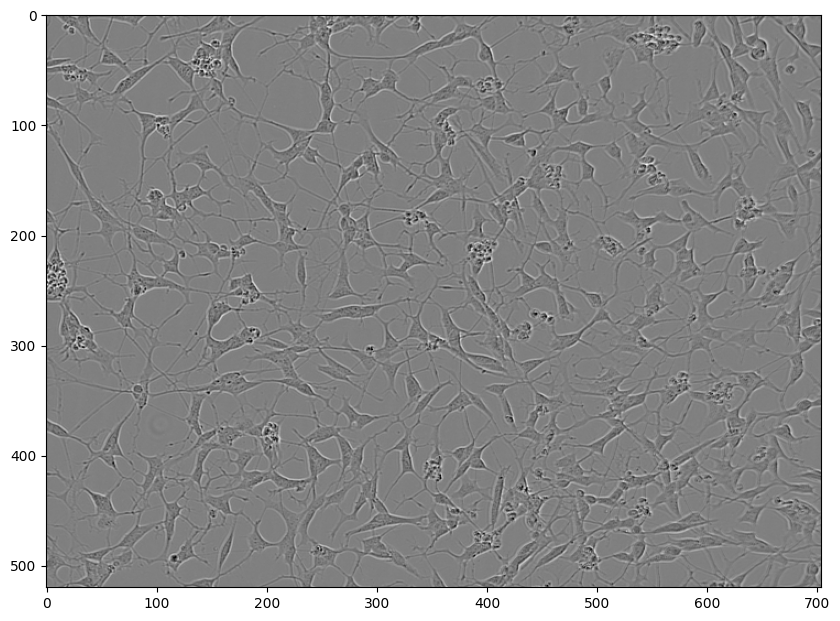

In [ ]:
img = cv2.imread('/content/data/train/0030fd0e6378.png')
plt.figure(figsize=(10, 10))
plt.imshow(img);

In [ ]:
train_df[train_df['id'] == '0030fd0e6378']

,id,annotation,width,height,cell_type,plate_time,sample_date,sample_id,elapsed_timedelta
0,0030fd0e6378,118145 6 118849 7 119553 8 120257 8 120961 9 1...,704,520,shsy5y,11h30m00s,2019-06-16,shsy5y[diff]_E10-4_Vessel-714_Ph_3,0 days 11:30:00
1,0030fd0e6378,189036 1 189739 3 190441 6 191144 7 191848 8 1...,704,520,shsy5y,11h30m00s,2019-06-16,shsy5y[diff]_E10-4_Vessel-714_Ph_3,0 days 11:30:00
2,0030fd0e6378,173567 3 174270 5 174974 5 175678 6 176382 7 1...,704,520,shsy5y,11h30m00s,2019-06-16,shsy5y[diff]_E10-4_Vessel-714_Ph_3,0 days 11:30:00
3,0030fd0e6378,196723 4 197427 6 198130 7 198834 8 199538 8 2...,704,520,shsy5y,11h30m00s,2019-06-16,shsy5y[diff]_E10-4_Vessel-714_Ph_3,0 days 11:30:00
4,0030fd0e6378,167818 3 168522 5 169225 7 169928 8 170632 9 1...,704,520,shsy5y,11h30m00s,2019-06-16,shsy5y[diff]_E10-4_Vessel-714_Ph_3,0 days 11:30:00
...,...,...,...,...,...,...,...,...,...
390,0030fd0e6378,264628 3 265328 8 266028 12 266729 15 267432 1...,704,520,shsy5y,11h30m00s,2019-06-16,shsy5y[diff]_E10-4_Vessel-714_Ph_3,0 days 11:30:00
391,0030fd0e6378,268853 4 269553 10 270255 12 270958 12 271661 ...,704,520,shsy5y,11h30m00s,2019-06-16,shsy5y[diff]_E10-4_Vessel-714_Ph_3,0 days 11:30:00
392,0030fd0e6378,2095 1 2798 3 3501 5 4203 7 4906 9 5609 10 631...,704,520,shsy5y,11h30m00s,2019-06-16,shsy5y[diff]_E10-4_Vessel-714_Ph_3,0 days 11:30:00
393,0030fd0e6378,105571 3 106274 5 106978 5 107682 6 108386 6 1...,704,520,shsy5y,11h30m00s,2019-06-16,shsy5y[diff]_E10-4_Vessel-714_Ph_3,0 days 11:30:00


Данный объект имеет 395 образцов (семлов).

In [ ]:
train_df[train_df['id'] == '0030fd0e6378']['sample_id'].value_counts()

shsy5y[diff]_E10-4_Vessel-714_Ph_3    395
Name: sample_id, dtype: int64

И все семплы - это `shsy5y[diff]_E10-4_Vessel-714_Ph_3`

In [ ]:
train_df[train_df['id'] == '0030fd0e6378']['annotation'].value_counts().index.nunique()

395

Аннотации у каждого семпла уникальны, но разве на представленной выше картинке 395 семлов (клеток) ???

### 3.4. Аннотации

In [ ]:
def decode_rle_mask(rle_mask, shape=(520, 704)):

    """
    Decode run-length encoded segmentation mask string into 2d array

    Parameters
    ----------
    rle_mask (str): Run-length encoded segmentation mask string
    shape (tuple): Height and width of the mask

    Returns
    -------
    mask [numpy.ndarray of shape (height, width)]: Decoded 2d segmentation mask
    """

    rle_mask = rle_mask.split()
    starts, lengths = [np.asarray(x, dtype=int) for x in (rle_mask[0:][::2], rle_mask[1:][::2])]
    starts -= 1
    ends = starts + lengths

    mask = np.zeros((shape[0] * shape[1]), dtype=np.uint8)
    for start, end in zip(starts, ends):
        mask[start:end] = 1

    mask = mask.reshape(shape[0], shape[1])
    return mask

In [ ]:
[np.asarray(x, dtype=int) for x in (train_df.iloc[0]['annotation'].split()[0:][::2], train_df.iloc[0]['annotation'].split()[1:][::2])]

[array([118145, 118849, 119553, 120257, 120961, 121665, 122369, 123074,
        123778, 124482, 125186, 125890, 126594, 127298, 128002, 128706,
        129410, 130114, 130818, 131523, 132227, 132931, 133635, 134339,
        135043, 135748, 136452, 137157, 137864, 138573]),
 array([ 6,  7,  8,  8,  9, 10, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22,
        23, 24, 24, 25, 25, 24, 24, 23, 21, 19, 16, 11,  4])]

In [ ]:
def visualize_image(df, image_id):

    """
    Visualize image along with segmentation masks

    Parameters
    ----------
    df [pandas.DataFrame of shape (73585, 9)]: Training dataframe
    image_id (str): Image ID (filename)
    """

    image_path = df.loc[df['id'] == image_id, 'id'].values[0]
    cell_type = df.loc[df['id'] == image_id, 'cell_type'].values[0]
    plate_time = df.loc[df['id'] == image_id, 'plate_time'].values[0]
    sample_date = df.loc[df['id'] == image_id, 'sample_date'].values[0]
    sample_id = df.loc[df['id'] == image_id, 'sample_id'].values[0]

    image = cv2.imread(f'data/train/{image_path}.png')
    image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    print(f'{image_id}\n{"-" * len(image_id)}')
    print(f'Image Mean: {np.mean(image):.4f}  -  Median: {np.median(image):.4f}  -  Std: {np.std(image):.4f} - Min: {np.min(image):.4f} -  Max: {np.max(image):.4f}')

    fig, axes = plt.subplots(figsize=(20, 20), ncols=2)
    fig.tight_layout(pad=5.0)

    axes[0].imshow(image, cmap='gray')
    masks = []
    for mask in df.loc[df['id'] == image_id, 'annotation'].values:
        decoded_mask = decode_rle_mask(rle_mask=mask, shape=image.shape)
        masks.append(decoded_mask)
    mask = np.stack(masks)
    mask = np.any(mask == 1, axis=0)
    axes[1].imshow(image, cmap='gray')
    axes[1].imshow(mask, alpha=0.4)

    for i in range(2):
        axes[i].set_xlabel('')
        axes[i].set_ylabel('')
        axes[i].tick_params(axis='x', labelsize=15, pad=10)
        axes[i].tick_params(axis='y', labelsize=15, pad=10)

    axes[0].set_title(f'{image_path} - {cell_type} - Annotations\n{plate_time} - {sample_date} - {sample_id}', fontsize=20, pad=15)
    axes[1].set_title('Segmentation Mask', fontsize=20, pad=15)
    plt.show()
    plt.close(fig)

9f1c2cfc936f
------------
Image Mean: 127.9925  -  Median: 128.0000  -  Std: 11.8427 - Min: 3.0000 -  Max: 249.0000


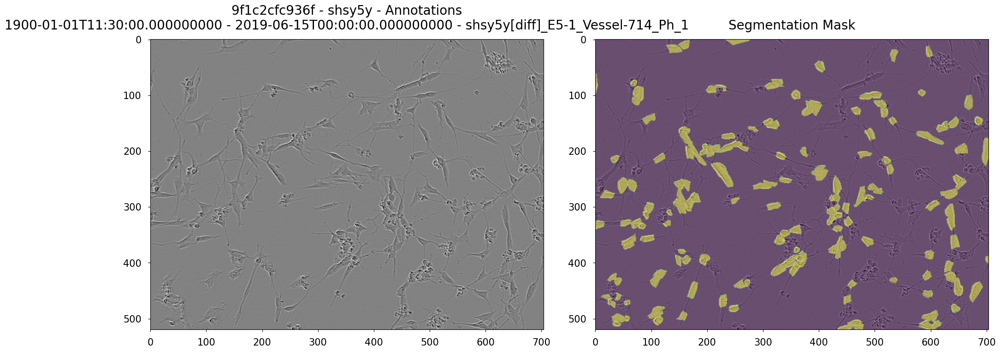

1874b96fd317
------------
Image Mean: 127.9873  -  Median: 128.0000  -  Std: 10.0747 - Min: 3.0000 -  Max: 255.0000


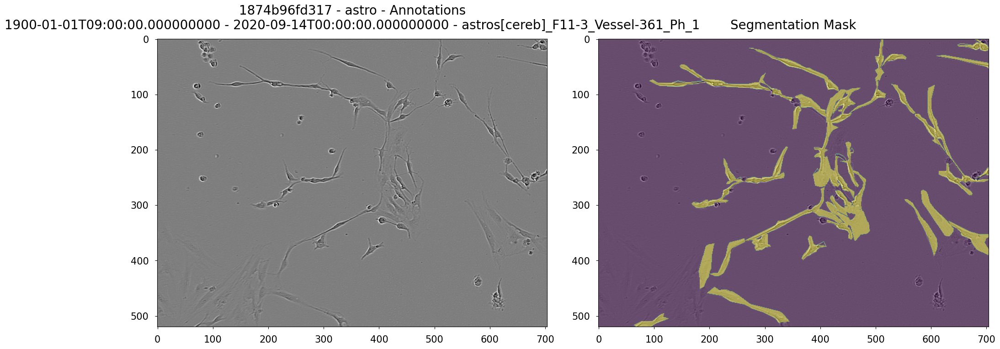

c97cc03675c7
------------
Image Mean: 128.0159  -  Median: 129.0000  -  Std: 16.6064 - Min: 3.0000 -  Max: 255.0000


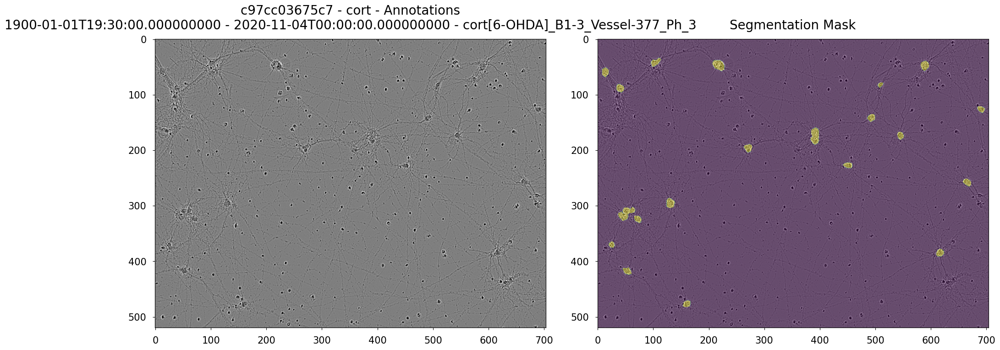

In [ ]:
for cell_type in train_df['cell_type'].unique():
    values = train_df[train_df['cell_type'] == cell_type].sample(1).iloc[0]
    img_id = values['id']
    visualize_image(train_df, img_id)

## 4.0. Аугментации

In [ ]:
def visualize(image, mask, original_image=None, original_mask=None, name_addtion=None):
    fontsize = 18

    if original_image is None and original_mask is None:
        f, ax = plt.subplots(2, 1, figsize=(8, 8))

        ax[0].imshow(image)
        ax[1].imshow(mask)
    else:
        f, ax = plt.subplots(2, 2, figsize=(10, 10))

        ax[0, 0].imshow(original_image)
        ax[0, 0].set_title('Original image', fontsize=fontsize)

        ax[1, 0].imshow(original_mask)
        ax[1, 0].set_title('Original mask', fontsize=fontsize)

        ax[0, 1].imshow(image)
        ax[0, 1].set_title('Transformed image', fontsize=fontsize)

        ax[1, 1].imshow(mask)
        ax[1, 1].set_title('Transformed mask', fontsize=fontsize)

(520, 704, 3) (520, 704)
(520, 704, 3) (520, 704)
(520, 704, 3) (520, 704)


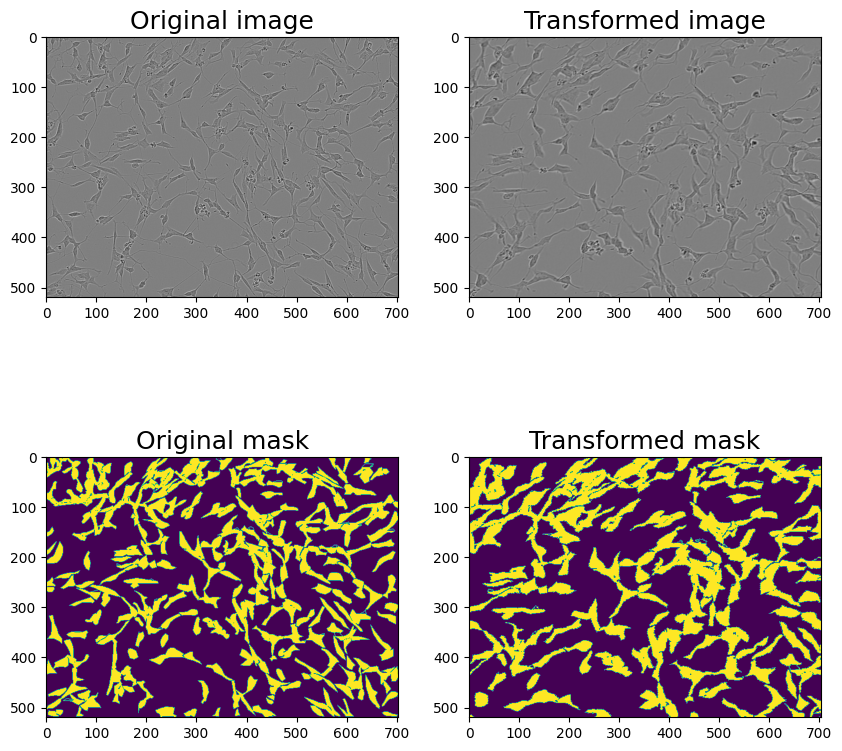

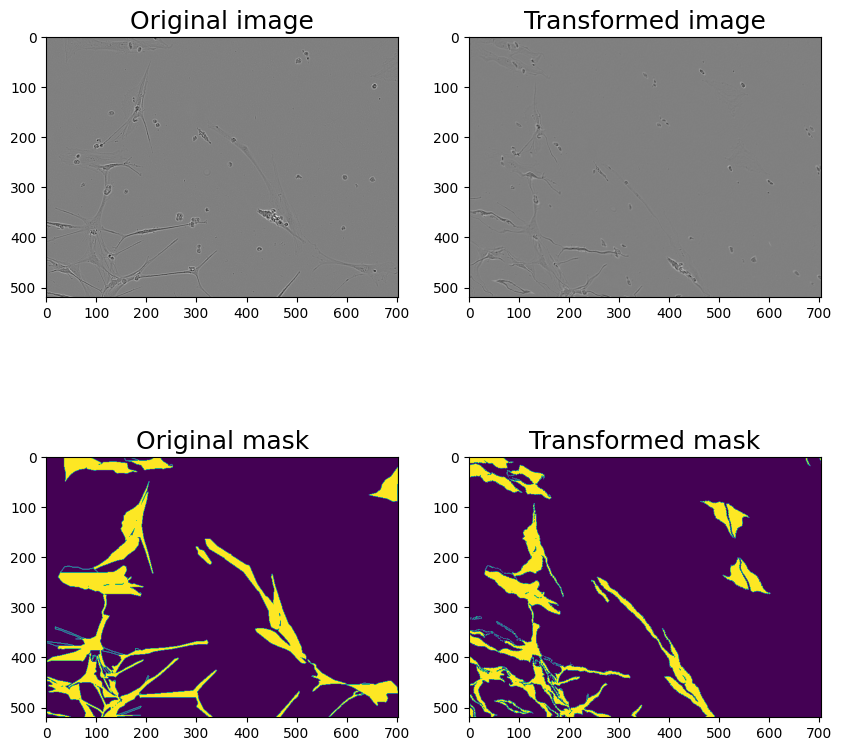

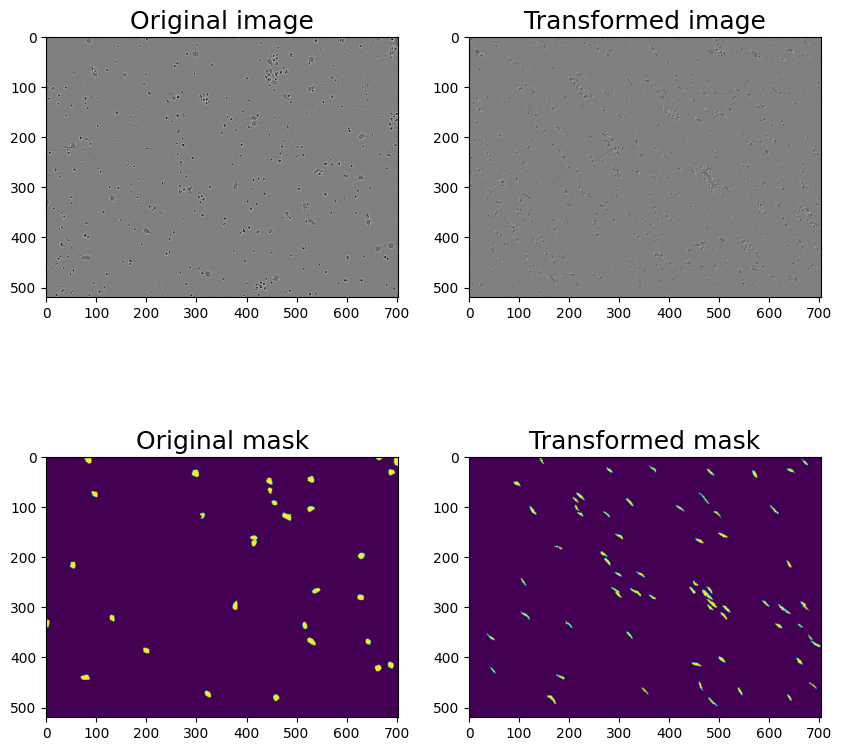

In [ ]:
for cell_type in train_df['cell_type'].unique():
    print
    values = train_df[train_df['cell_type'] == cell_type].sample(1).iloc[0]
    img_id = values['id']
    image = cv2.imread(f'data/train/{img_id}.png')
    # image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    masks = []
    for mask in train_df.loc[train_df['id'] == img_id, 'annotation'].values:
        decoded_mask = decode_rle_mask(rle_mask=mask, shape=image.shape)
        masks.append(decoded_mask)
    mask = np.stack(masks)
    mask = np.uint8(np.any(mask == 1, axis=0))

    aug = A.ElasticTransform(p=1, alpha=60, sigma=120 * 0.05, alpha_affine=120)

    augmented = aug(image=image, mask=mask)

    image_padded = augmented['image']
    mask_padded = augmented['mask']

    print(image_padded.shape, mask_padded.shape)

    visualize(image_padded, mask_padded, original_image=image, original_mask=mask)

## 5.0. Выводы

- в тренировочном датасете имеется 3 класса, класс `shsy5y` составляет больше 50%, т.е. классы несбалансированы
- видна четкая связь между классом и датой создания образца, временем создания
- изображения имеют одинаковый размер
- визуализированы различные изображения и их маски
- проведена пробная аугментация и визуализированы ее результаты